## Problem Statement:Analysing the Attrition Rate of a Company
##### Company want to know what changes they should make to their workplace, in order to get most of their employees to stay. Also, they want to know which of these variables is most important and needs to be addressed right away.


In [1]:
#Basic and most important libraries
import pandas as pd , numpy as np
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler , MinMaxScaler
from collections import Counter
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
!pip install plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly

#Classifiers
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier , VotingClassifier , RandomForestClassifier
from sklearn.linear_model import LogisticRegression , RidgeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier 
from sklearn.naive_bayes import GaussianNB
!pip install xgboost
from xgboost import plot_importance
from xgboost import XGBClassifier
from sklearn.svm import SVC

#Model evaluation tools
from sklearn.metrics import classification_report , accuracy_score , confusion_matrix
from sklearn.metrics import accuracy_score,f1_score
from sklearn.model_selection import cross_val_score

#Data processing functions
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv("general_data.csv")
pd.options.display.max_columns=None
data.sample(5)

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
4335,4336,50,No,Travel_Rarely,Sales,19,4,Marketing,1,Male,3,Sales Executive,Married,31950,2.0,Y,11,8,0,5.0,4,3,0,2,3.0,3.0,2.0,2,3
321,322,34,No,Travel_Rarely,Sales,2,3,Marketing,1,Male,1,Sales Representative,Single,103120,1.0,Y,12,8,0,6.0,2,6,1,3,3.0,1.0,3.0,3,3
2146,2147,25,No,Travel_Rarely,Research & Development,18,2,Life Sciences,1,Male,1,Research Scientist,Single,36220,1.0,Y,25,8,0,2.0,0,2,2,1,4.0,2.0,2.0,3,4
2380,2381,24,No,Travel_Frequently,Research & Development,15,3,Life Sciences,1,Male,2,Research Scientist,Single,54880,1.0,Y,22,8,1,6.0,6,6,1,3,1.0,4.0,3.0,3,4
140,141,37,No,Non-Travel,Research & Development,1,3,Medical,1,Male,3,Laboratory Technician,Married,20080,3.0,Y,22,8,0,15.0,5,13,10,7,2.0,3.0,3.0,2,4


In [3]:
data.drop(["EmployeeID"], axis=1, inplace=True)

In [4]:
data.shape

(4410, 28)

In [5]:
data.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
Gender                      object
JobLevel                     int64
JobRole                     object
MaritalStatus               object
MonthlyIncome                int64
NumCompaniesWorked         float64
Over18                      object
PercentSalaryHike            int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears          float64
TrainingTimesLastYear        int64
YearsAtCompany               int64
YearsSinceLastPromotion      int64
YearsWithCurrManager         int64
EnvironmentSatisfaction    float64
JobSatisfaction            float64
WorkLifeBalance            float64
JobInvolvement               int64
PerformanceRating            int64
dtype: object

In [6]:
data.dtypes.value_counts()

int64      15
object      8
float64     5
dtype: int64

In [7]:
data.drop(["Over18","StandardHours","EmployeeCount"], axis=1, inplace=True)

In [8]:
numerical_features = data.dtypes[data.dtypes != "object"].index
print("Number of Numerical features: ", len(numerical_features))
print(numerical_features)
# Pulling out names of categorical variables by conditioning dtypes equal to object type
categorical_features = data.dtypes[data.dtypes == "object"].index
print("Number of Categorical features: ", len(categorical_features))
print(categorical_features)

Number of Numerical features:  18
Index(['Age', 'DistanceFromHome', 'Education', 'JobLevel', 'MonthlyIncome',
       'NumCompaniesWorked', 'PercentSalaryHike', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance',
       'JobInvolvement', 'PerformanceRating'],
      dtype='object')
Number of Categorical features:  7
Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus'],
      dtype='object')


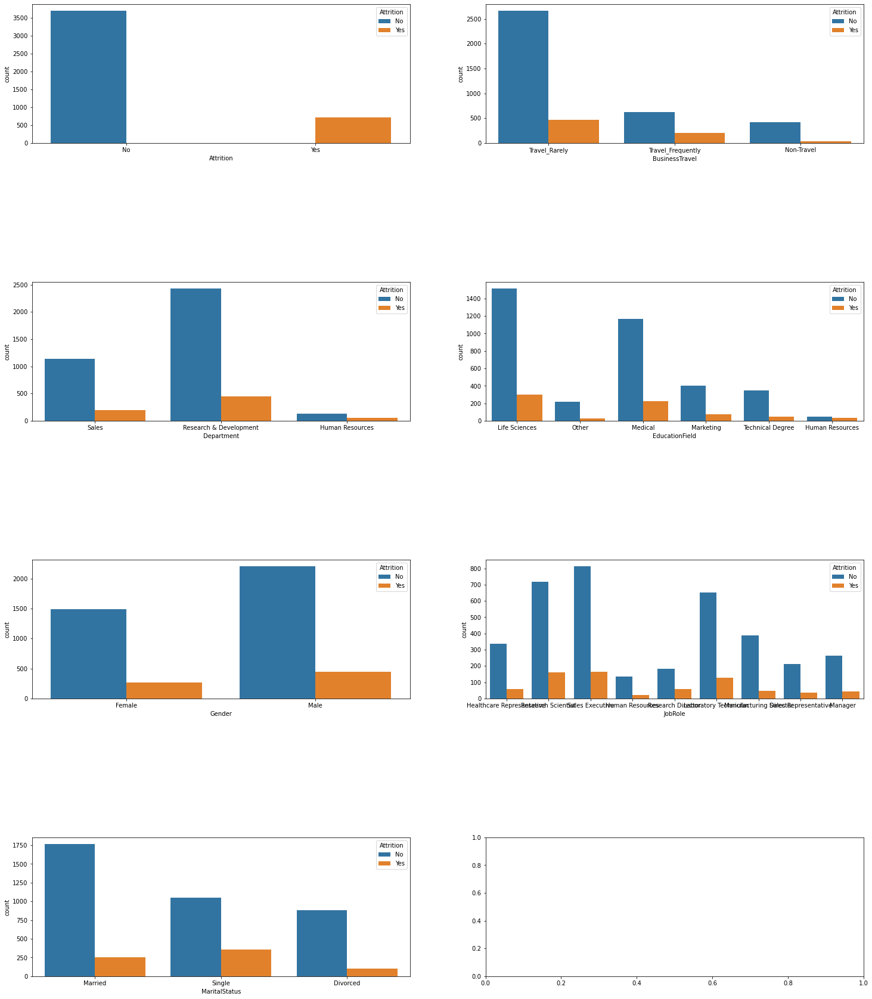

In [9]:
### Data Visualization

fig,axes = plt.subplots(4,2,figsize=(25,30))
for idx,cat_col in enumerate(categorical_features):
    row,col = idx//2,idx%2
    sns.countplot(x=cat_col,data=data,hue='Attrition',ax=axes[row,col])


plt.subplots_adjust(hspace=1)

# Plots above convey following things about the dataset:


               Age  DistanceFromHome    Education     JobLevel  MonthlyIncome  \
count  4410.000000       4410.000000  4410.000000  4410.000000    4410.000000   
mean     36.923810          9.192517     2.912925     2.063946   65029.312925   
std       9.133301          8.105026     1.023933     1.106689   47068.888559   
min      18.000000          1.000000     1.000000     1.000000   10090.000000   
25%      30.000000          2.000000     2.000000     1.000000   29110.000000   
50%      36.000000          7.000000     3.000000     2.000000   49190.000000   
75%      43.000000         14.000000     4.000000     3.000000   83800.000000   
max      60.000000         29.000000     5.000000     5.000000  199990.000000   

       NumCompaniesWorked  PercentSalaryHike  StockOptionLevel  \
count         4391.000000        4410.000000       4410.000000   
mean             2.694830          15.209524          0.793878   
std              2.498887           3.659108          0.851883   
min   

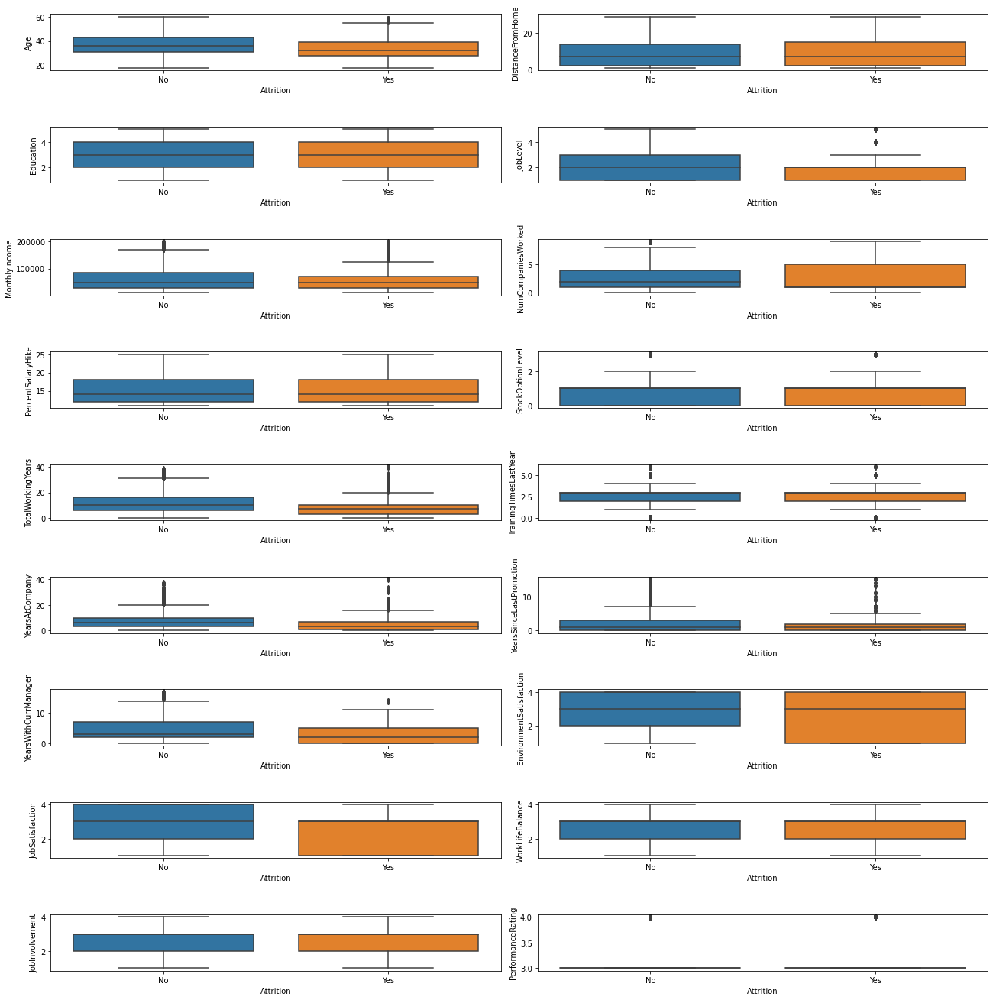

In [10]:
fig,axes = plt.subplots(9,2,figsize=(18,18))
for idx,num_col in enumerate(numerical_features):
    row,col = idx//2,idx%2
    sns.boxplot(y=num_col,data=data,x='Attrition',ax=axes[row,col])
    plt.tight_layout(pad=0.5)

print(data[numerical_features].describe())
plt.subplots_adjust(hspace=1)

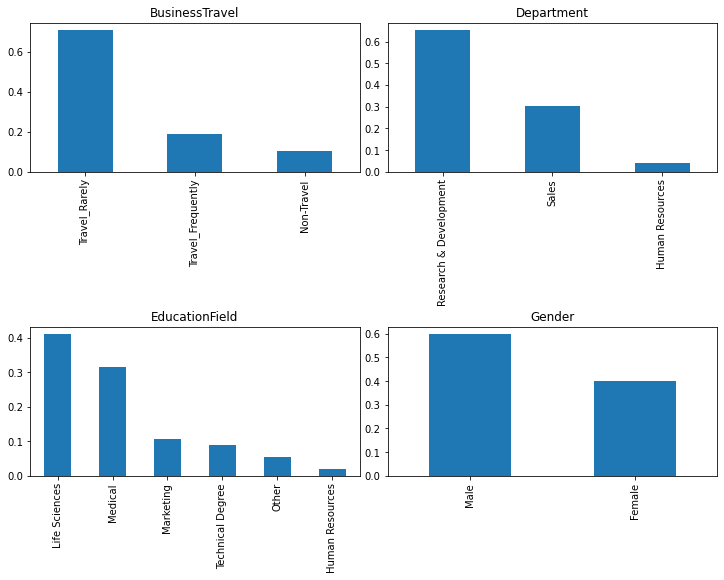

In [11]:
plt.subplot(221)
data.BusinessTravel.value_counts(normalize=True).plot(kind = 'bar', title = "BusinessTravel",figsize=(10,8))
plt.tight_layout(pad=0.5)
plt.subplot(222)
data.Department.value_counts(normalize=True).plot(kind = 'bar', title = "Department")
plt.tight_layout(pad=0.5)
plt.subplot(223)
data.EducationField.value_counts(normalize=True).plot(kind = 'bar',title = "EducationField")
plt.tight_layout(pad=0.5)
plt.subplot(224)
data.Gender.value_counts(normalize=True).plot(kind = 'bar',title = "Gender")
plt.tight_layout(pad=0.5)


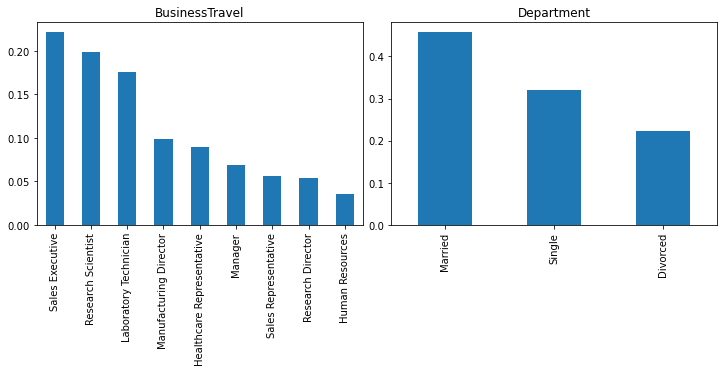

In [12]:
plt.subplot(221)
data.JobRole.value_counts(normalize=True).plot(kind = 'bar', title = "BusinessTravel",figsize=(10,8))
plt.tight_layout(pad=0.5)
plt.subplot(222)
data.MaritalStatus.value_counts(normalize=True).plot(kind = 'bar', title = "Department")
plt.tight_layout(pad=0.5)

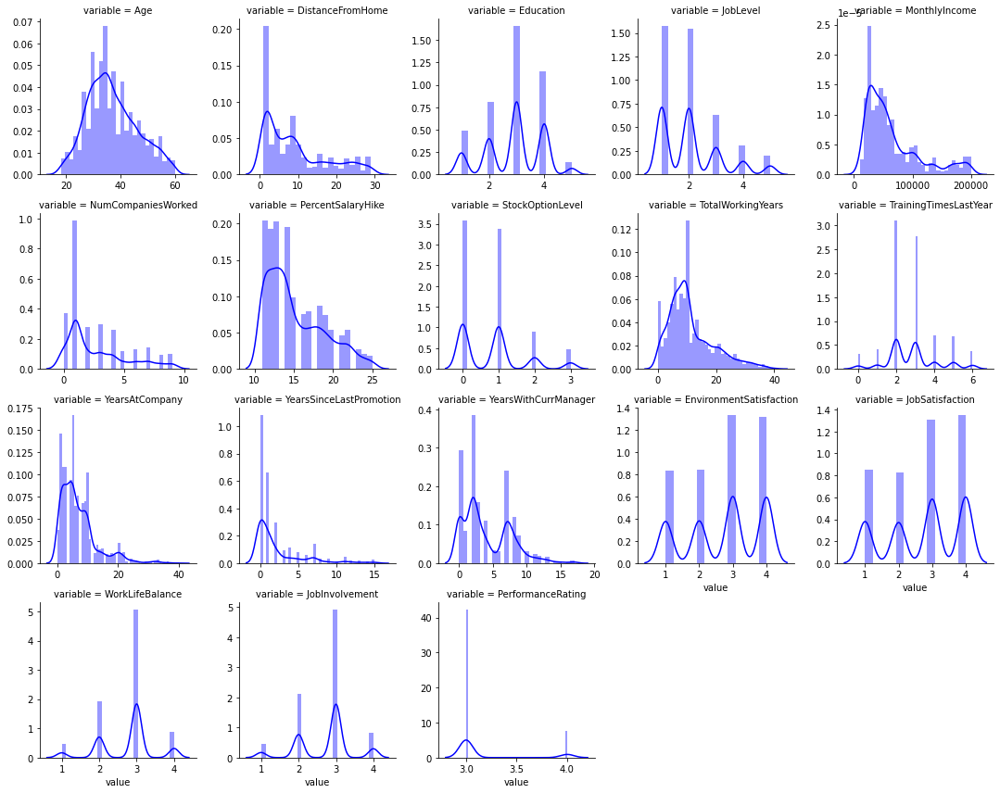

In [13]:
f = pd.melt(data, id_vars=['Attrition'],value_vars= numerical_features)
g = sns.FacetGrid(f, col="variable",  col_wrap=5, sharex=False, sharey=False)
g = g.map(sns.distplot, "value", color="blue")

In [14]:
data["Attrition"] = le.fit_transform(data["Attrition"])
data.head(5)

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,51,0,Travel_Rarely,Sales,6,2,Life Sciences,Female,1,Healthcare Representative,Married,131160,1.0,11,0,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,31,1,Travel_Frequently,Research & Development,10,1,Life Sciences,Female,1,Research Scientist,Single,41890,0.0,23,1,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,32,0,Travel_Frequently,Research & Development,17,4,Other,Male,4,Sales Executive,Married,193280,1.0,15,3,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,38,0,Non-Travel,Research & Development,2,5,Life Sciences,Male,3,Human Resources,Married,83210,3.0,11,3,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,32,0,Travel_Rarely,Research & Development,10,1,Medical,Male,1,Sales Executive,Single,23420,4.0,12,2,9.0,2,6,0,4,4.0,1.0,3.0,3,3


In [15]:
Left=data[~(data["Attrition"]==0)]
stayed=data[data["Attrition"]==0]
print("Percentage of employees who left =", 1.*len(Left)/len(data)*100.0, "%")
print("Percentage of employees who stayed =", 1.*len(stayed)/len(data)*100.0, "%")

Percentage of employees who left = 16.122448979591837 %
Percentage of employees who stayed = 83.87755102040816 %


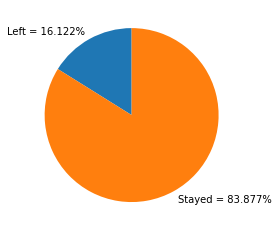

In [16]:
p=1.*len(Left)/len(data)*100.0
q=1.*len(stayed)/len(data)*100.0
y=np.array([p,q])
mylabels = ["Left = 16.122%", "Stayed = 83.877%"]
plt.pie(y,labels = mylabels,startangle = 90)
plt.show() 

In [17]:
correlation_mat = data.corr()

<AxesSubplot:>

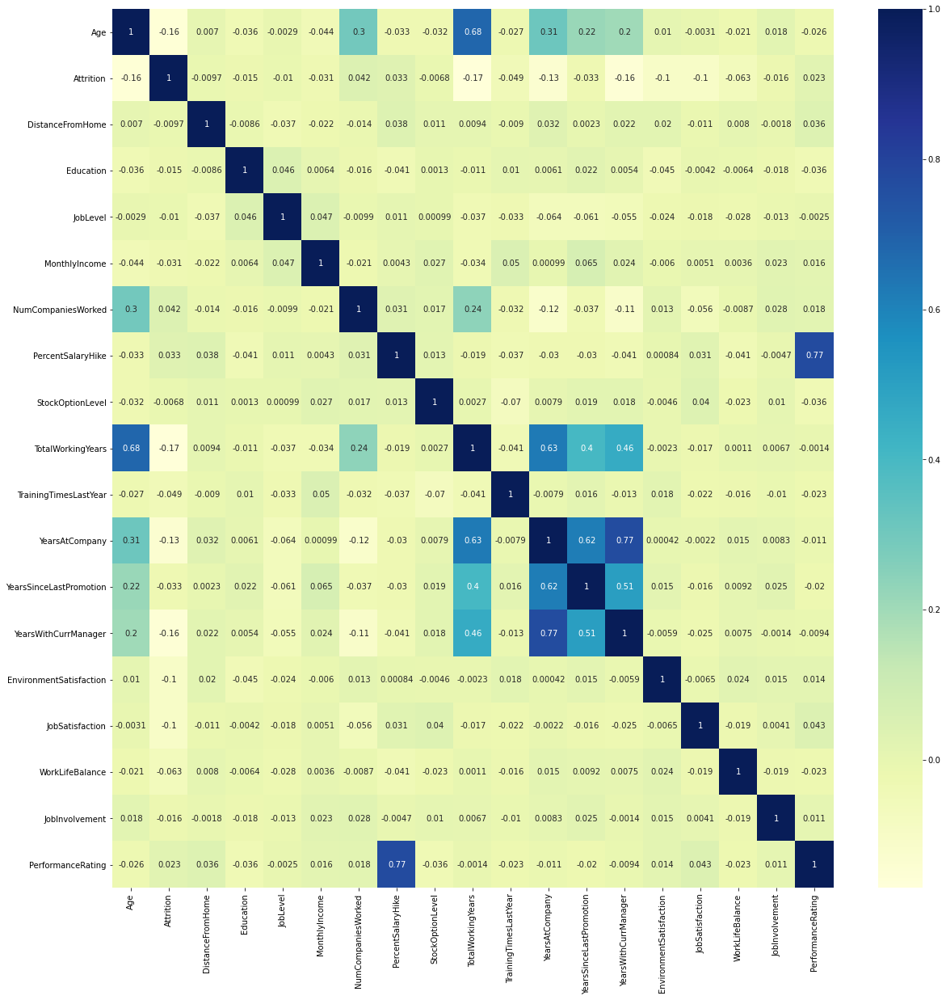

In [18]:
f, ax = plt.subplots(figsize = (20, 20))
sns.heatmap(correlation_mat, annot = True,cmap="YlGnBu")

In [19]:
corr=data.corr()["Attrition"]
corr[np.argsort(corr)[::-1]]

Attrition                  1.000000
NumCompaniesWorked         0.042345
PercentSalaryHike          0.032533
PerformanceRating          0.023403
StockOptionLevel          -0.006839
DistanceFromHome          -0.009730
JobLevel                  -0.010290
Education                 -0.015111
JobInvolvement            -0.015588
MonthlyIncome             -0.031176
YearsSinceLastPromotion   -0.033019
TrainingTimesLastYear     -0.049431
WorkLifeBalance           -0.062756
EnvironmentSatisfaction   -0.102142
JobSatisfaction           -0.102847
YearsAtCompany            -0.134392
YearsWithCurrManager      -0.156199
Age                       -0.159205
TotalWorkingYears         -0.170338
Name: Attrition, dtype: float64

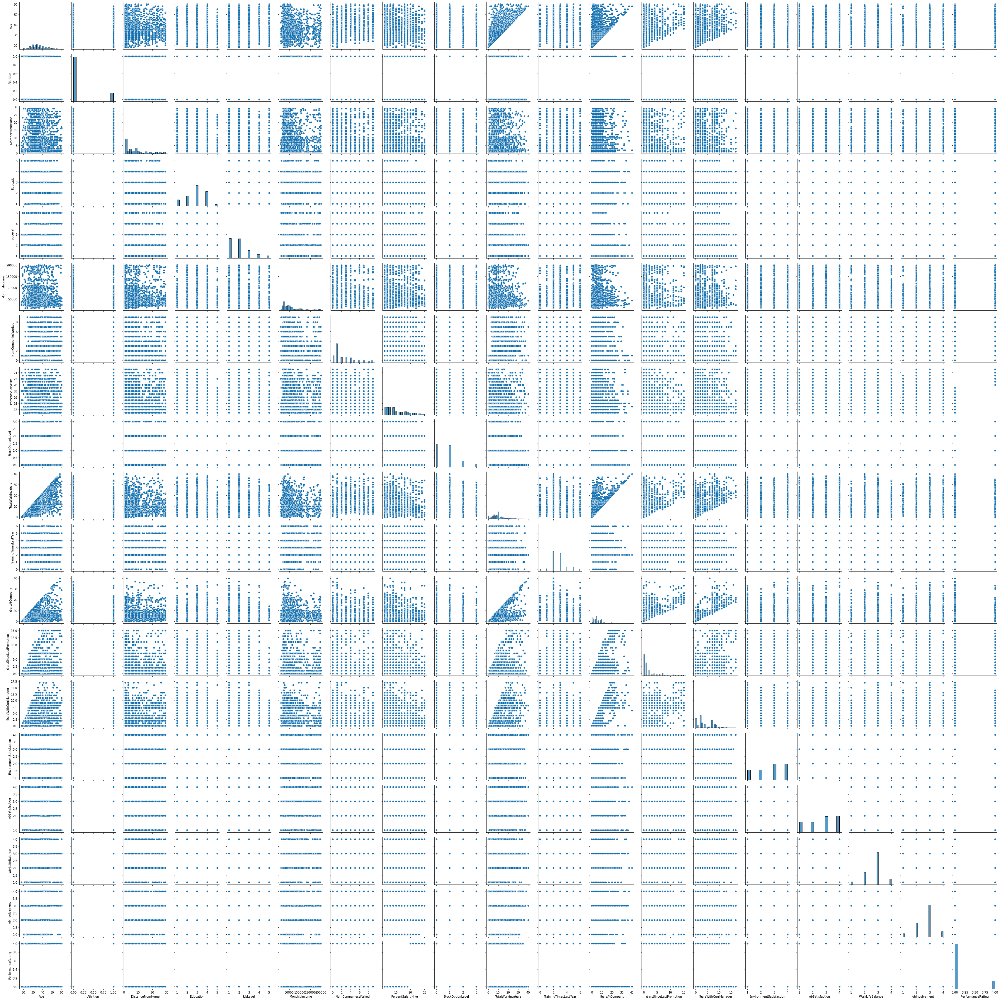

In [20]:
sns.pairplot(data)
plt.tight_layout()    
plt.show()   

In [21]:
data.describe()

,Age,Attrition,DistanceFromHome,Education,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
count,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4391.000000,4410.000000,4410.000000,4401.000000,4410.000000,4410.000000,4410.000000,4410.000000,4385.000000,4390.000000,4372.000000,4410.000000,4410.000000
mean,36.923810,0.161224,9.192517,2.912925,2.063946,65029.312925,2.694830,15.209524,0.793878,11.279936,2.799320,7.008163,2.187755,4.123129,2.723603,2.728246,2.761436,2.729932,3.153741
std,9.133301,0.367780,8.105026,1.023933,1.106689,47068.888559,2.498887,3.659108,0.851883,7.782222,1.288978,6.125135,3.221699,3.567327,1.092756,1.101253,0.706245,0.711400,0.360742
min,18.000000,0.000000,1.000000,1.000000,1.000000,10090.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,30.000000,0.000000,2.000000,2.000000,1.000000,29110.000000,1.000000,12.000000,0.000000,6.000000,2.000000,3.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000
50%,36.000000,0.000000,7.000000,3.000000,2.000000,49190.000000,2.000000,14.000000,1.000000,10.000000,3.000000,5.000000,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,43.000000,0.000000,14.000000,4.000000,3.000000,83800.000000,4.000000,18.000000,1.000000,15.000000,3.000000,9.000000,3.000000,7.000000,4.000000,4.000000,3.000000,3.000000,3.000000
max,60.000000,1.000000,29.000000,5.000000,5.000000,199990.000000,9.000000,25.000000,3.000000,40.000000,6.000000,40.000000,15.000000,17.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [22]:
data.describe(include="all")

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
count,4410.000000,4410.000000,4410,4410,4410.000000,4410.000000,4410,4410,4410.000000,4410,4410,4410.000000,4391.000000,4410.000000,4410.000000,4401.000000,4410.000000,4410.000000,4410.000000,4410.000000,4385.000000,4390.000000,4372.000000,4410.000000,4410.000000
unique,NaN,NaN,3,3,NaN,NaN,6,2,NaN,9,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Travel_Rarely,Research & Development,NaN,NaN,Life Sciences,Male,NaN,Sales Executive,Married,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,3129,2883,NaN,NaN,1818,2646,NaN,978,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,36.923810,0.161224,NaN,NaN,9.192517,2.912925,NaN,NaN,2.063946,NaN,NaN,65029.312925,2.694830,15.209524,0.793878,11.279936,2.799320,7.008163,2.187755,4.123129,2.723603,2.728246,2.761436,2.729932,3.153741
std,9.133301,0.367780,NaN,NaN,8.105026,1.023933,NaN,NaN,1.106689,NaN,NaN,47068.888559,2.498887,3.659108,0.851883,7.782222,1.288978,6.125135,3.221699,3.567327,1.092756,1.101253,0.706245,0.711400,0.360742
min,18.000000,0.000000,NaN,NaN,1.000000,1.000000,NaN,NaN,1.000000,NaN,NaN,10090.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,30.000000,0.000000,NaN,NaN,2.000000,2.000000,NaN,NaN,1.000000,NaN,NaN,29110.000000,1.000000,12.000000,0.000000,6.000000,2.000000,3.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000
50%,36.000000,0.000000,NaN,NaN,7.000000,3.000000,NaN,NaN,2.000000,NaN,NaN,49190.000000,2.000000,14.000000,1.000000,10.000000,3.000000,5.000000,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,43.000000,0.000000,NaN,NaN,14.000000,4.000000,NaN,NaN,3.000000,NaN,NaN,83800.000000,4.000000,18.000000,1.000000,15.000000,3.000000,9.000000,3.000000,7.000000,4.000000,4.000000,3.000000,3.000000,3.000000


In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   Attrition                4410 non-null   int32  
 2   BusinessTravel           4410 non-null   object 
 3   Department               4410 non-null   object 
 4   DistanceFromHome         4410 non-null   int64  
 5   Education                4410 non-null   int64  
 6   EducationField           4410 non-null   object 
 7   Gender                   4410 non-null   object 
 8   JobLevel                 4410 non-null   int64  
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   int64  
 12  NumCompaniesWorked       4391 non-null   float64
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [24]:
# Check which variables have missing values
data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
Gender                      0
JobLevel                    0
JobRole                     0
MaritalStatus               0
MonthlyIncome               0
NumCompaniesWorked         19
PercentSalaryHike           0
StockOptionLevel            0
TotalWorkingYears           9
TrainingTimesLastYear       0
YearsAtCompany              0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
EnvironmentSatisfaction    25
JobSatisfaction            20
WorkLifeBalance            38
JobInvolvement              0
PerformanceRating           0
dtype: int64

In [25]:
# Seeing missing values in percentage
data.isnull().sum()*100/data.shape[0]

Age                        0.000000
Attrition                  0.000000
BusinessTravel             0.000000
Department                 0.000000
DistanceFromHome           0.000000
Education                  0.000000
EducationField             0.000000
Gender                     0.000000
JobLevel                   0.000000
JobRole                    0.000000
MaritalStatus              0.000000
MonthlyIncome              0.000000
NumCompaniesWorked         0.430839
PercentSalaryHike          0.000000
StockOptionLevel           0.000000
TotalWorkingYears          0.204082
TrainingTimesLastYear      0.000000
YearsAtCompany             0.000000
YearsSinceLastPromotion    0.000000
YearsWithCurrManager       0.000000
EnvironmentSatisfaction    0.566893
JobSatisfaction            0.453515
WorkLifeBalance            0.861678
JobInvolvement             0.000000
PerformanceRating          0.000000
dtype: float64

In [26]:
columns_with_missing_values=data.columns[data.isnull().any()]

data[columns_with_missing_values].isnull().sum()

NumCompaniesWorked         19
TotalWorkingYears           9
EnvironmentSatisfaction    25
JobSatisfaction            20
WorkLifeBalance            38
dtype: int64

### Visualize the missing values in absolute & percentage term

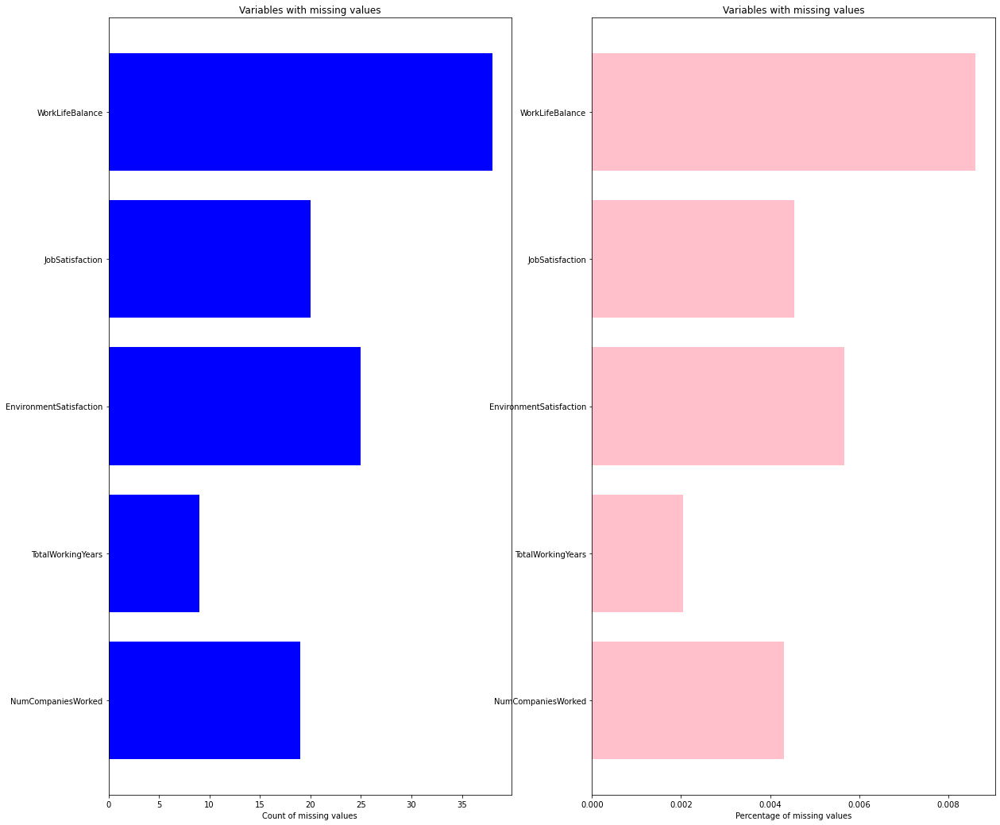

In [27]:
# To hold variable names
labels = [] 

# To hold the count of missing values for each variable 
valuecount = [] 

# To hold the percentage of missing values for each variable
percentcount = [] 

for col in columns_with_missing_values:
    labels.append(col)
    valuecount.append(data[col].isnull().sum())
    percentcount.append(data[col].isnull().sum()/data.shape[0])
    
ind = np.arange(len(labels))

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(20,18))

rects = ax1.barh(ind, np.array(valuecount), color='blue')
ax1.set_yticks(ind)
ax1.set_yticklabels(labels, rotation='horizontal')
ax1.set_xlabel("Count of missing values")
ax1.set_title("Variables with missing values");

rects = ax2.barh(ind, np.array(percentcount), color='pink')
ax2.set_yticks(ind)
ax2.set_yticklabels(labels, rotation='horizontal')
ax2.set_xlabel("Percentage of missing values")
ax2.set_title("Variables with missing values");

<AxesSubplot:>

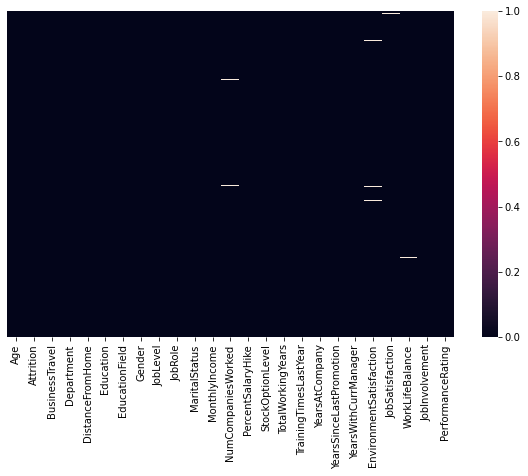

In [28]:
plt.figure(figsize=(10,6))
sns.heatmap(data.isnull(),yticklabels=False)

In [29]:
#fill Na values with NaN
data=data.fillna(np.NaN)
data

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,51,0,Travel_Rarely,Sales,6,2,Life Sciences,Female,1,Healthcare Representative,Married,131160,1.0,11,0,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,31,1,Travel_Frequently,Research & Development,10,1,Life Sciences,Female,1,Research Scientist,Single,41890,0.0,23,1,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,32,0,Travel_Frequently,Research & Development,17,4,Other,Male,4,Sales Executive,Married,193280,1.0,15,3,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,38,0,Non-Travel,Research & Development,2,5,Life Sciences,Male,3,Human Resources,Married,83210,3.0,11,3,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,32,0,Travel_Rarely,Research & Development,10,1,Medical,Male,1,Sales Executive,Single,23420,4.0,12,2,9.0,2,6,0,4,4.0,1.0,3.0,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,42,0,Travel_Rarely,Research & Development,5,4,Medical,Female,1,Research Scientist,Single,60290,3.0,17,1,10.0,5,3,0,2,4.0,1.0,3.0,3,3
4406,29,0,Travel_Rarely,Research & Development,2,4,Medical,Male,1,Laboratory Technician,Divorced,26790,2.0,15,0,10.0,2,3,0,2,4.0,4.0,3.0,2,3
4407,25,0,Travel_Rarely,Research & Development,25,2,Life Sciences,Male,2,Sales Executive,Married,37020,0.0,20,0,5.0,4,4,1,2,1.0,3.0,3.0,3,4
4408,42,0,Travel_Rarely,Sales,18,2,Medical,Male,1,Laboratory Technician,Divorced,23980,0.0,14,1,10.0,2,9,7,8,4.0,1.0,3.0,2,3


Age                        0
Attrition                  0
BusinessTravel             0
Department                 0
DistanceFromHome           0
Education                  0
EducationField             0
Gender                     0
JobLevel                   0
JobRole                    0
MaritalStatus              0
MonthlyIncome              0
NumCompaniesWorked         0
PercentSalaryHike          0
StockOptionLevel           0
TotalWorkingYears          0
TrainingTimesLastYear      0
YearsAtCompany             0
YearsSinceLastPromotion    0
YearsWithCurrManager       0
EnvironmentSatisfaction    0
JobSatisfaction            0
WorkLifeBalance            0
JobInvolvement             0
PerformanceRating          0
dtype: int64


<AxesSubplot:>

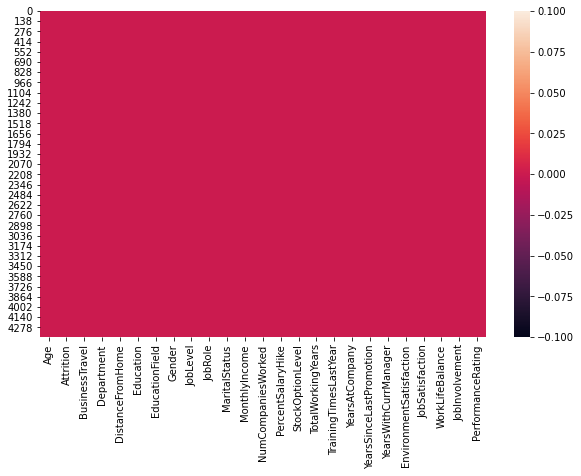

In [30]:
#fill NaN values with mode value of specific column
data["NumCompaniesWorked"].fillna(data["NumCompaniesWorked"].mode()[0],inplace=True)
data["TotalWorkingYears"].fillna(data["TotalWorkingYears"].mode()[0],inplace=True)
data["EnvironmentSatisfaction"].fillna(data["EnvironmentSatisfaction"].mode()[0],inplace=True)
data["JobSatisfaction"].fillna(data["JobSatisfaction"].mode()[0],inplace=True)
data["WorkLifeBalance"].fillna(data["WorkLifeBalance"].mode()[0],inplace=True)
print(data.isnull().sum())

#Heat map for null values
plt.figure(figsize=(10,6))
sns.heatmap(data.isnull())

Normal Distribution Central limit theorem In simple language we can say that maximum amount of data / or maximum number of data points are near the Mean of the all data points.

To validate he normal distribution of the data:- Mean Mode Median are Equal.

We can identify the distribution of entire data with the help of Mean and Standard Deviation.

When the data is normally distributed maximum data is centralized near the mean value of the data.

To get understanding of distribtuion we can simply plot Distribution plot i.e. Simple Histogram.

Normally Distributed data represents a Bell Shaped curve.

Also Mean , Mode , Median on Normaly Distributed data are equal (Mean=Mode=Median)

One more method is to calculate mean which should be 0 or near to 0 and Standard deviation 1 or near 1.

Mean = sum(All Data Points)/count(Data Points)

Standard Deviation = Root of { sum [Square (each data point - mean of whole data) ] }

In [31]:
print(numerical_features)

Index(['Age', 'DistanceFromHome', 'Education', 'JobLevel', 'MonthlyIncome',
       'NumCompaniesWorked', 'PercentSalaryHike', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance',
       'JobInvolvement', 'PerformanceRating'],
      dtype='object')


In [32]:
### Checking if the non-categorical variables are Normally Distributed or Not. i.e. Checking outliers...

print("Data distribution analysis:->---------------------------------------\n")
print("\nMean:->\n")
print("Age: ",np.mean(data["Age"]))
print("DistanceFromHome: ",np.mean(data["DistanceFromHome"]))
print("Education: ",np.mean(data["Education"]))
print("JobLevel: ",np.mean(data["JobLevel"]))
print("MonthlyIncome: ",np.mean(data["MonthlyIncome"]))
print("NumCompaniesWorked: ",np.mean(data["NumCompaniesWorked"]))
print("PercentSalaryHike: ",np.mean(data["PercentSalaryHike"]))
print("StockOptionLevel: ",np.mean(data["StockOptionLevel"]))
print("TotalWorkingYears: ",np.mean(data["TotalWorkingYears"]))
print("TrainingTimesLastYear: ",np.mean(data["TrainingTimesLastYear"]))
print("YearsAtCompany: ",np.mean(data["YearsAtCompany"]))
print("YearsSinceLastPromotion: ",np.mean(data["YearsSinceLastPromotion"]))
print("YearsWithCurrManager: ",np.mean(data["YearsWithCurrManager"]))
print("EnvironmentSatisfaction: ",np.mean(data["EnvironmentSatisfaction"]))
print("JobSatisfaction: ",np.mean(data["JobSatisfaction"]))
print("WorkLifeBalance: ",np.mean(data["WorkLifeBalance"]))
print("JobInvolvement: ",np.mean(data["JobInvolvement"]))
print("PerformanceRating: ",np.mean(data["PerformanceRating"]))

print("\nMode:->\n")
print("Age: ",stats.mode(data["Age"])[0])
print("DistanceFromHome: ",stats.mode(data["DistanceFromHome"])[0])
print("Education: ",stats.mode(data["Education"])[0])
print("JobLevel: ",stats.mode(data["JobLevel"])[0])
print("MonthlyIncome: ",stats.mode(data["MonthlyIncome"])[0])
print("NumCompaniesWorked: ",stats.mode(data["NumCompaniesWorked"])[0])
print("PercentSalaryHike: ",stats.mode(data["PercentSalaryHike"])[0])
print("StockOptionLevel: ",stats.mode(data["StockOptionLevel"])[0])
print("TotalWorkingYears: ",stats.mode(data["TotalWorkingYears"])[0])
print("TrainingTimesLastYear: ",stats.mode(data["TrainingTimesLastYear"])[0])
print("YearsAtCompany: ",stats.mode(data["YearsAtCompany"])[0])
print("YearsSinceLastPromotion: ",stats.mode(data["YearsSinceLastPromotion"])[0])
print("YearsWithCurrManager: ",stats.mode(data["YearsWithCurrManager"])[0])
print("EnvironmentSatisfaction: ",stats.mode(data["EnvironmentSatisfaction"])[0])
print("JobSatisfaction: ",stats.mode(data["JobSatisfaction"])[0])
print("WorkLifeBalance: ",stats.mode(data["WorkLifeBalance"])[0])
print("JobInvolvement: ",stats.mode(data["JobInvolvement"])[0])
print("PerformanceRating: ",stats.mode(data["PerformanceRating"])[0])

print("\nMedian:->\n")
print("Age: ",np.median(data["Age"]))
print("DistanceFromHome: ",np.median(data["DistanceFromHome"]))
print("Education: ",np.median(data["Education"]))
print("JobLevel: ",np.median(data["JobLevel"]))
print("MonthlyIncome: ",np.median(data["MonthlyIncome"]))
print("NumCompaniesWorked: ",np.median(data["NumCompaniesWorked"]))
print("PercentSalaryHike: ",np.median(data["PercentSalaryHike"]))
print("StockOptionLevel: ",np.median(data["StockOptionLevel"]))
print("TotalWorkingYears: ",np.median(data["TotalWorkingYears"]))
print("TrainingTimesLastYear: ",np.median(data["TrainingTimesLastYear"]))
print("YearsAtCompany: ",np.median(data["YearsAtCompany"]))
print("YearsSinceLastPromotion: ",np.median(data["YearsSinceLastPromotion"]))
print("YearsWithCurrManager: ",np.median(data["YearsWithCurrManager"]))
print("EnvironmentSatisfaction: ",np.median(data["EnvironmentSatisfaction"]))
print("JobSatisfaction: ",np.median(data["JobSatisfaction"]))
print("WorkLifeBalance: ",np.median(data["WorkLifeBalance"]))
print("JobInvolvement: ",np.median(data["JobInvolvement"]))
print("PerformanceRating: ",np.median(data["PerformanceRating"]))

print("\nStandard Deviation:->\n")
print("Age: ",np.std(data["Age"]))
print("DistanceFromHome: ",np.std(data["DistanceFromHome"]))
print("Education: ",np.std(data["Education"]))
print("JobLevel: ",np.std(data["JobLevel"]))
print("MonthlyIncome: ",np.std(data["MonthlyIncome"]))
print("NumCompaniesWorked: ",np.std(data["NumCompaniesWorked"]))
print("PercentSalaryHike: ",np.std(data["PercentSalaryHike"]))
print("StockOptionLevel: ",np.std(data["StockOptionLevel"]))
print("TotalWorkingYears: ",np.std(data["TotalWorkingYears"]))
print("TrainingTimesLastYear: ",np.std(data["TrainingTimesLastYear"]))
print("YearsAtCompany: ",np.std(data["YearsAtCompany"]))
print("YearsSinceLastPromotion: ",np.std(data["YearsSinceLastPromotion"]))
print("YearsWithCurrManager: ",np.std(data["YearsWithCurrManager"]))
print("EnvironmentSatisfaction: ",np.std(data["EnvironmentSatisfaction"]))
print("JobSatisfaction: ",np.std(data["JobSatisfaction"]))
print("WorkLifeBalance: ",np.std(data["WorkLifeBalance"]))
print("JobInvolvement: ",np.std(data["JobInvolvement"]))
print("PerformanceRating: ",np.std(data["PerformanceRating"]))



Data distribution analysis:->---------------------------------------


Mean:->

Age:  36.923809523809524
DistanceFromHome:  9.19251700680272
Education:  2.912925170068027
JobLevel:  2.0639455782312925
MonthlyIncome:  65029.31292517007
NumCompaniesWorked:  2.6875283446712017
PercentSalaryHike:  15.209523809523809
StockOptionLevel:  0.7938775510204081
TotalWorkingYears:  11.27732426303855
TrainingTimesLastYear:  2.7993197278911564
YearsAtCompany:  7.0081632653061225
YearsSinceLastPromotion:  2.1877551020408164
YearsWithCurrManager:  4.12312925170068
EnvironmentSatisfaction:  2.725170068027211
JobSatisfaction:  2.734013605442177
WorkLifeBalance:  2.7634920634920634
JobInvolvement:  2.7299319727891156
PerformanceRating:  3.1537414965986397

Mode:->

Age:  [35]
DistanceFromHome:  [2]
Education:  [3]
JobLevel:  [1]
MonthlyIncome:  [23420]
NumCompaniesWorked:  [1.]
PercentSalaryHike:  [11]
StockOptionLevel:  [0]
TotalWorkingYears:  [10.]
TrainingTimesLastYear:  [2]
YearsAtCompany:  [5]
YearsS

In [33]:
fig = px.histogram(data["Age"],x ="Age" ,y = "Age" )
fig.update_layout(title="Age")
fig.show()

fig = px.histogram(data["DistanceFromHome"],x ="DistanceFromHome" ,y = "DistanceFromHome" )
fig.update_layout(title="DistanceFromHome")
fig.show()

fig = px.histogram(data["Education"],x ="Education" ,y = "Education" )
fig.update_layout(title="Education")
fig.show()

fig = px.histogram(data["JobLevel"],x ="JobLevel" ,y = "JobLevel" )
fig.update_layout(title="JobLevel")
fig.show()

fig = px.histogram(data["MonthlyIncome"],x ="MonthlyIncome" ,y = "MonthlyIncome" )
fig.update_layout(title="MonthlyIncome")
fig.show()

fig = px.histogram(data["NumCompaniesWorked"],x ="NumCompaniesWorked" ,y = "NumCompaniesWorked" )
fig.update_layout(title="NumCompaniesWorked")
fig.show()

fig = px.histogram(data["PercentSalaryHike"],x ="PercentSalaryHike" ,y = "PercentSalaryHike" )
fig.update_layout(title="PercentSalaryHike")
fig.show()

fig = px.histogram(data["StockOptionLevel"],x ="StockOptionLevel" ,y = "StockOptionLevel" )
fig.update_layout(title="StockOptionLevel")
fig.show()

fig = px.histogram(data["TotalWorkingYears"],x ="TotalWorkingYears" ,y = "TotalWorkingYears" )
fig.update_layout(title="TotalWorkingYears")
fig.show()


fig = px.histogram(data["TrainingTimesLastYear"],x ="TrainingTimesLastYear" ,y = "TrainingTimesLastYear" )
fig.update_layout(title="TrainingTimesLastYear")
fig.show()

fig = px.histogram(data["YearsAtCompany"],x ="YearsAtCompany" ,y = "YearsAtCompany" )
fig.update_layout(title="YearsAtCompany")
fig.show()

fig = px.histogram(data["YearsSinceLastPromotion"],x ="YearsSinceLastPromotion" ,y = "YearsSinceLastPromotion" )
fig.update_layout(title="YearsSinceLastPromotion")
fig.show()


fig = px.histogram(data["YearsWithCurrManager"],x ="YearsWithCurrManager" ,y = "YearsWithCurrManager" )
fig.update_layout(title="YearsWithCurrManager")
fig.show()

fig = px.histogram(data["EnvironmentSatisfaction"],x ="EnvironmentSatisfaction" ,y = "EnvironmentSatisfaction" )
fig.update_layout(title="EnvironmentSatisfaction")
fig.show()


fig = px.histogram(data["JobSatisfaction"],x ="JobSatisfaction" ,y = "JobSatisfaction" )
fig.update_layout(title="JobSatisfaction")
fig.show()

fig = px.histogram(data["WorkLifeBalance"],x ="WorkLifeBalance" ,y = "WorkLifeBalance" )
fig.update_layout(title="WorkLifeBalance")
fig.show()

fig = px.histogram(data["JobInvolvement"],x ="JobInvolvement" ,y = "JobInvolvement" )
fig.update_layout(title="JobInvolvement")
fig.show()

fig = px.histogram(data["PerformanceRating"],x ="PerformanceRating" ,y = "PerformanceRating" )
fig.update_layout(title="PerformanceRating")
fig.show()


Not normaly distributed.

In [34]:
num=data[['Age', 'DistanceFromHome', 'Education', 'JobLevel', 'MonthlyIncome',
       'NumCompaniesWorked', 'PercentSalaryHike', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance',
       'JobInvolvement', 'PerformanceRating']]

In [35]:
scaler = preprocessing.MinMaxScaler(feature_range=(0, 2))
d = scaler.fit_transform(num)
d

array([[1.57142857, 0.35714286, 0.5       , ..., 0.66666667, 1.33333333,
        0.        ],
       [0.61904762, 0.64285714, 0.        , ..., 2.        , 0.66666667,
        2.        ],
       [0.66666667, 1.14285714, 1.5       , ..., 0.        , 1.33333333,
        0.        ],
       ...,
       [0.33333333, 1.71428571, 0.5       , ..., 1.33333333, 1.33333333,
        2.        ],
       [1.14285714, 1.21428571, 0.5       , ..., 1.33333333, 0.66666667,
        0.        ],
       [1.04761905, 1.92857143, 1.        , ..., 1.33333333, 2.        ,
        0.        ]])

In [36]:
print("Data distribution analysis:->---------------------------------------\n")
print("\nMean:->\n")
print("Age: ",np.mean(data["Age"]))
print("DistanceFromHome: ",np.mean(data["DistanceFromHome"]))
print("Education: ",np.mean(data["Education"]))
print("JobLevel: ",np.mean(data["JobLevel"]))
print("MonthlyIncome: ",np.mean(data["MonthlyIncome"]))
print("NumCompaniesWorked: ",np.mean(data["NumCompaniesWorked"]))
print("PercentSalaryHike: ",np.mean(data["PercentSalaryHike"]))
print("StockOptionLevel: ",np.mean(data["StockOptionLevel"]))
print("TotalWorkingYears: ",np.mean(data["TotalWorkingYears"]))
print("TrainingTimesLastYear: ",np.mean(data["TrainingTimesLastYear"]))
print("YearsAtCompany: ",np.mean(data["YearsAtCompany"]))
print("YearsSinceLastPromotion: ",np.mean(data["YearsSinceLastPromotion"]))
print("YearsWithCurrManager: ",np.mean(data["YearsWithCurrManager"]))
print("EnvironmentSatisfaction: ",np.mean(data["EnvironmentSatisfaction"]))
print("JobSatisfaction: ",np.mean(data["JobSatisfaction"]))
print("WorkLifeBalance: ",np.mean(data["WorkLifeBalance"]))
print("JobInvolvement: ",np.mean(data["JobInvolvement"]))
print("PerformanceRating: ",np.mean(data["PerformanceRating"]))

print("\nMode:->\n")
print("Age: ",stats.mode(data["Age"])[0])
print("DistanceFromHome: ",stats.mode(data["DistanceFromHome"])[0])
print("Education: ",stats.mode(data["Education"])[0])
print("JobLevel: ",stats.mode(data["JobLevel"])[0])
print("MonthlyIncome: ",stats.mode(data["MonthlyIncome"])[0])
print("NumCompaniesWorked: ",stats.mode(data["NumCompaniesWorked"])[0])
print("PercentSalaryHike: ",stats.mode(data["PercentSalaryHike"])[0])
print("StockOptionLevel: ",stats.mode(data["StockOptionLevel"])[0])
print("TotalWorkingYears: ",stats.mode(data["TotalWorkingYears"])[0])
print("TrainingTimesLastYear: ",stats.mode(data["TrainingTimesLastYear"])[0])
print("YearsAtCompany: ",stats.mode(data["YearsAtCompany"])[0])
print("YearsSinceLastPromotion: ",stats.mode(data["YearsSinceLastPromotion"])[0])
print("YearsWithCurrManager: ",stats.mode(data["YearsWithCurrManager"])[0])
print("EnvironmentSatisfaction: ",stats.mode(data["EnvironmentSatisfaction"])[0])
print("JobSatisfaction: ",stats.mode(data["JobSatisfaction"])[0])
print("WorkLifeBalance: ",stats.mode(data["WorkLifeBalance"])[0])
print("JobInvolvement: ",stats.mode(data["JobInvolvement"])[0])
print("PerformanceRating: ",stats.mode(data["PerformanceRating"])[0])

print("\nMedian:->\n")
print("Age: ",np.median(data["Age"]))
print("DistanceFromHome: ",np.median(data["DistanceFromHome"]))
print("Education: ",np.median(data["Education"]))
print("JobLevel: ",np.median(data["JobLevel"]))
print("MonthlyIncome: ",np.median(data["MonthlyIncome"]))
print("NumCompaniesWorked: ",np.median(data["NumCompaniesWorked"]))
print("PercentSalaryHike: ",np.median(data["PercentSalaryHike"]))
print("StockOptionLevel: ",np.median(data["StockOptionLevel"]))
print("TotalWorkingYears: ",np.median(data["TotalWorkingYears"]))
print("TrainingTimesLastYear: ",np.median(data["TrainingTimesLastYear"]))
print("YearsAtCompany: ",np.median(data["YearsAtCompany"]))
print("YearsSinceLastPromotion: ",np.median(data["YearsSinceLastPromotion"]))
print("YearsWithCurrManager: ",np.median(data["YearsWithCurrManager"]))
print("EnvironmentSatisfaction: ",np.median(data["EnvironmentSatisfaction"]))
print("JobSatisfaction: ",np.median(data["JobSatisfaction"]))
print("WorkLifeBalance: ",np.median(data["WorkLifeBalance"]))
print("JobInvolvement: ",np.median(data["JobInvolvement"]))
print("PerformanceRating: ",np.median(data["PerformanceRating"]))

print("\nStandard Deviation:->\n")
print("Age: ",np.std(data["Age"]))
print("DistanceFromHome: ",np.std(data["DistanceFromHome"]))
print("Education: ",np.std(data["Education"]))
print("JobLevel: ",np.std(data["JobLevel"]))
print("MonthlyIncome: ",np.std(data["MonthlyIncome"]))
print("NumCompaniesWorked: ",np.std(data["NumCompaniesWorked"]))
print("PercentSalaryHike: ",np.std(data["PercentSalaryHike"]))
print("StockOptionLevel: ",np.std(data["StockOptionLevel"]))
print("TotalWorkingYears: ",np.std(data["TotalWorkingYears"]))
print("TrainingTimesLastYear: ",np.std(data["TrainingTimesLastYear"]))
print("YearsAtCompany: ",np.std(data["YearsAtCompany"]))
print("YearsSinceLastPromotion: ",np.std(data["YearsSinceLastPromotion"]))
print("YearsWithCurrManager: ",np.std(data["YearsWithCurrManager"]))
print("EnvironmentSatisfaction: ",np.std(data["EnvironmentSatisfaction"]))
print("JobSatisfaction: ",np.std(data["JobSatisfaction"]))
print("WorkLifeBalance: ",np.std(data["WorkLifeBalance"]))
print("JobInvolvement: ",np.std(data["JobInvolvement"]))
print("PerformanceRating: ",np.std(data["PerformanceRating"]))


Data distribution analysis:->---------------------------------------


Mean:->

Age:  36.923809523809524
DistanceFromHome:  9.19251700680272
Education:  2.912925170068027
JobLevel:  2.0639455782312925
MonthlyIncome:  65029.31292517007
NumCompaniesWorked:  2.6875283446712017
PercentSalaryHike:  15.209523809523809
StockOptionLevel:  0.7938775510204081
TotalWorkingYears:  11.27732426303855
TrainingTimesLastYear:  2.7993197278911564
YearsAtCompany:  7.0081632653061225
YearsSinceLastPromotion:  2.1877551020408164
YearsWithCurrManager:  4.12312925170068
EnvironmentSatisfaction:  2.725170068027211
JobSatisfaction:  2.734013605442177
WorkLifeBalance:  2.7634920634920634
JobInvolvement:  2.7299319727891156
PerformanceRating:  3.1537414965986397

Mode:->

Age:  [35]
DistanceFromHome:  [2]
Education:  [3]
JobLevel:  [1]
MonthlyIncome:  [23420]
NumCompaniesWorked:  [1.]
PercentSalaryHike:  [11]
StockOptionLevel:  [0]
TotalWorkingYears:  [10.]
TrainingTimesLastYear:  [2]
YearsAtCompany:  [5]
YearsS

In [37]:
fig = px.histogram(data["Age"],x ="Age" ,y = "Age" )
fig.update_layout(title="Age")
fig.show()

fig = px.histogram(data["DistanceFromHome"],x ="DistanceFromHome" ,y = "DistanceFromHome" )
fig.update_layout(title="DistanceFromHome")
fig.show()

fig = px.histogram(data["Education"],x ="Education" ,y = "Education" )
fig.update_layout(title="Education")
fig.show()

fig = px.histogram(data["JobLevel"],x ="JobLevel" ,y = "JobLevel" )
fig.update_layout(title="JobLevel")
fig.show()

fig = px.histogram(data["MonthlyIncome"],x ="MonthlyIncome" ,y = "MonthlyIncome" )
fig.update_layout(title="MonthlyIncome")
fig.show()

fig = px.histogram(data["NumCompaniesWorked"],x ="NumCompaniesWorked" ,y = "NumCompaniesWorked" )
fig.update_layout(title="NumCompaniesWorked")
fig.show()

fig = px.histogram(data["PercentSalaryHike"],x ="PercentSalaryHike" ,y = "PercentSalaryHike" )
fig.update_layout(title="PercentSalaryHike")
fig.show()

fig = px.histogram(data["StockOptionLevel"],x ="StockOptionLevel" ,y = "StockOptionLevel" )
fig.update_layout(title="StockOptionLevel")
fig.show()

fig = px.histogram(data["TotalWorkingYears"],x ="TotalWorkingYears" ,y = "TotalWorkingYears" )
fig.update_layout(title="TotalWorkingYears")
fig.show()


fig = px.histogram(data["TrainingTimesLastYear"],x ="TrainingTimesLastYear" ,y = "TrainingTimesLastYear" )
fig.update_layout(title="TrainingTimesLastYear")
fig.show()

fig = px.histogram(data["YearsAtCompany"],x ="YearsAtCompany" ,y = "YearsAtCompany" )
fig.update_layout(title="YearsAtCompany")
fig.show()

fig = px.histogram(data["YearsSinceLastPromotion"],x ="YearsSinceLastPromotion" ,y = "YearsSinceLastPromotion" )
fig.update_layout(title="YearsSinceLastPromotion")
fig.show()


fig = px.histogram(data["YearsWithCurrManager"],x ="YearsWithCurrManager" ,y = "YearsWithCurrManager" )
fig.update_layout(title="YearsWithCurrManager")
fig.show()

fig = px.histogram(data["EnvironmentSatisfaction"],x ="EnvironmentSatisfaction" ,y = "EnvironmentSatisfaction" )
fig.update_layout(title="EnvironmentSatisfaction")
fig.show()


fig = px.histogram(data["JobSatisfaction"],x ="JobSatisfaction" ,y = "JobSatisfaction" )
fig.update_layout(title="JobSatisfaction")
fig.show()

fig = px.histogram(data["WorkLifeBalance"],x ="WorkLifeBalance" ,y = "WorkLifeBalance" )
fig.update_layout(title="WorkLifeBalance")
fig.show()

fig = px.histogram(data["JobInvolvement"],x ="JobInvolvement" ,y = "JobInvolvement" )
fig.update_layout(title="JobInvolvement")
fig.show()

fig = px.histogram(data["PerformanceRating"],x ="PerformanceRating" ,y = "PerformanceRating" )
fig.update_layout(title="PerformanceRating")
fig.show()


<AxesSubplot:xlabel='Attrition', ylabel='count'>

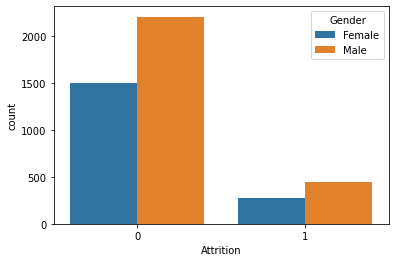

In [38]:
sns.countplot(x="Attrition", hue="Gender", data=data)

<AxesSubplot:xlabel='Attrition', ylabel='count'>

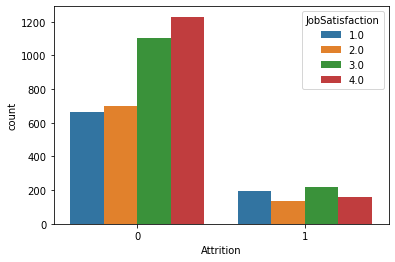

In [39]:
sns.countplot(x="Attrition", hue="JobSatisfaction", data=data)

<AxesSubplot:xlabel='Attrition', ylabel='count'>

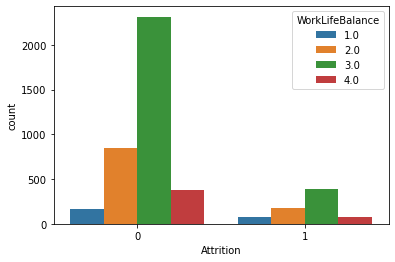

In [40]:
sns.countplot(x="Attrition", hue="WorkLifeBalance", data=data)

<AxesSubplot:xlabel='Age', ylabel='count'>

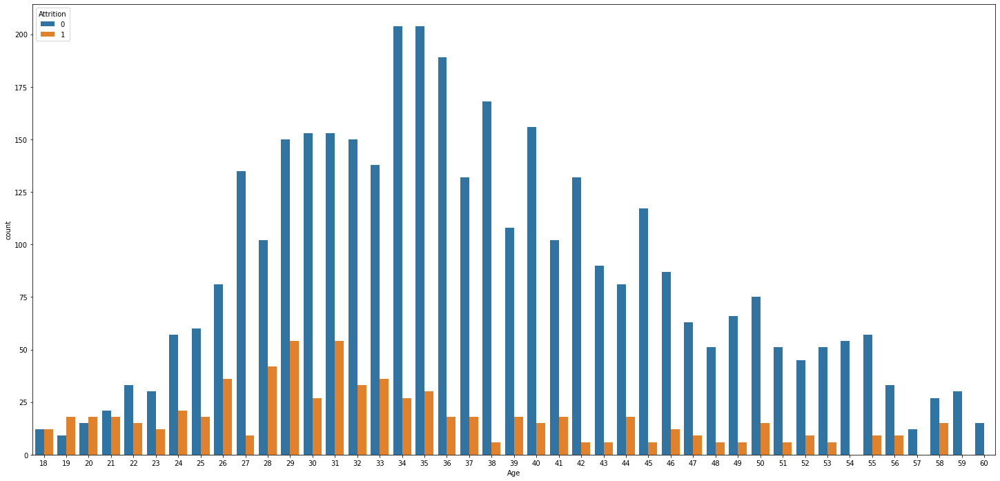

In [41]:
plt.figure(figsize=[25, 12])
sns.countplot(x = 'Age', hue = 'Attrition', data = data)

In [42]:
print(categorical_features)

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus'],
      dtype='object')


In [43]:
data["BusinessTravel"] = le.fit_transform(data["BusinessTravel"])
data["Department"] = le.fit_transform(data["Department"])
data["EducationField"] = le.fit_transform(data["EducationField"])
data["Gender"] = le.fit_transform(data["Gender"])
data["JobRole"] = le.fit_transform(data["JobRole"])
data["MaritalStatus"] = le.fit_transform(data["MaritalStatus"])
data.head(5)

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,51,0,2,2,6,2,1,0,1,0,1,131160,1.0,11,0,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,31,1,1,1,10,1,1,0,1,6,2,41890,0.0,23,1,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,32,0,1,1,17,4,4,1,4,7,1,193280,1.0,15,3,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,38,0,0,1,2,5,1,1,3,1,1,83210,3.0,11,3,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,32,0,2,1,10,1,3,1,1,7,2,23420,4.0,12,2,9.0,2,6,0,4,4.0,1.0,3.0,3,3


Feature Importance In order to create best predictive model we need to best understand the available data and get most information from the data.

In multivariate data it is important to understand the iortance of varialbes and how much they are contributing towards the target variable. Such that we can remove unnecessary variables to increase model performance.

Many times dataset consists of exta columns which do not identically serve information to classify the data. This leads in Wrong Assumption of model while training.

To understand the importance of the data we are going to use Machine Learning classifiers and then will plot bar graph based on importance.

Also XGBoost has built-in Feature Importance Plotting tool which we are going to use.

Using more than one classifier will increase the confidence on our assumption of which variables to keep and which to remove.

In [44]:
#Dividing data into Input X variables and Target Y variable
X = data.drop(["Attrition"],axis=1)
y = data["Attrition"]

Feature importance by XGBoost:->

[19:03:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Age -> 0.05047725
BusinessTravel -> 0.050609738
Department -> 0.044079933
DistanceFromHome -> 0.03664147
Education -> 0.03478872
EducationField -> 0.0445016
Gender -> 0.024729015
JobLevel -> 0.028961621
JobRole -> 0.037481293
MaritalStatus -> 0.053732656
MonthlyIncome -> 0.038661133
NumCompaniesWorked -> 0.056709994
PercentSalaryHike -> 0.035544865
StockOptionLevel -> 0.02792362
TotalWorkingYears -> 0.057148997
TrainingTimesLastYear -> 0.045699485
YearsAtCompany -> 0.049691822
YearsSinceLastPromotion -> 0.05750112
YearsWithCurrManager -> 0.04666994
EnvironmentSatisfaction -> 0.04630402
JobSatisfaction -> 0.055971067
WorkLifeBalance -> 0.040729187
J

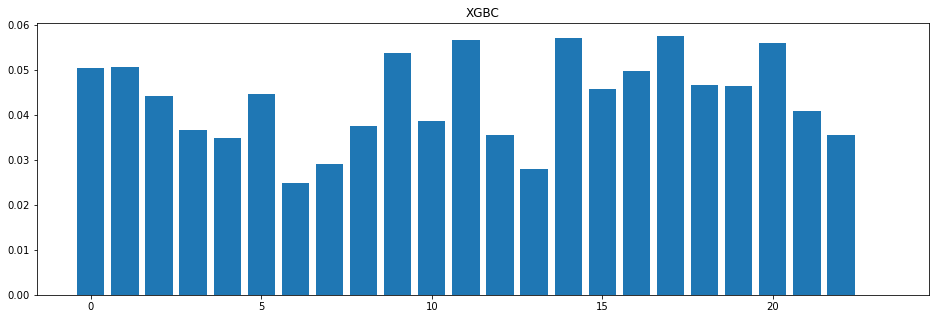

Feature importance by Random Forest:->

Age -> 0.08902637386701523
BusinessTravel -> 0.022974597004998758
Department -> 0.02156511656749385
DistanceFromHome -> 0.059176312134789334
Education -> 0.03251554441826499
EducationField -> 0.03412832490936379
Gender -> 0.013491580057086467
JobLevel -> 0.03204340667161646
JobRole -> 0.042979322816991655
MaritalStatus -> 0.03642197215084743
MonthlyIncome -> 0.08638498126059299
NumCompaniesWorked -> 0.04853005505602532
PercentSalaryHike -> 0.05429394875815334
StockOptionLevel -> 0.026212008066172004
TotalWorkingYears -> 0.07518863893651911
TrainingTimesLastYear -> 0.03563679156547
YearsAtCompany -> 0.059204964261942016
YearsSinceLastPromotion -> 0.03795103473315056
YearsWithCurrManager -> 0.046086685845166904
EnvironmentSatisfaction -> 0.037175627665194874
JobSatisfaction -> 0.03834773099705318
WorkLifeBalance -> 0.03417667849546028
JobInvolvement -> 0.028031402543059077
PerformanceRating -> 0.008456901217572492


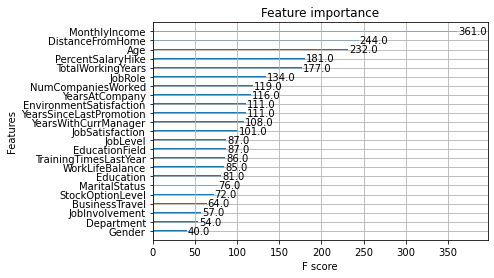

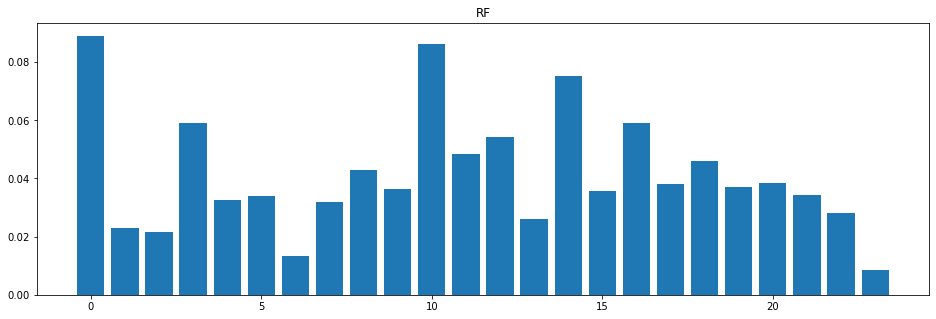

Feature importance by Decision Tree:->

Age -> 0.08704308905555747
BusinessTravel -> 0.01060159135100043
Department -> 0.028885424873185152
DistanceFromHome -> 0.06386895334043909
Education -> 0.04024106724640465
EducationField -> 0.016676129856057542
Gender -> 0.003353626193873815
JobLevel -> 0.02680021575022004
JobRole -> 0.06519854541001444
MaritalStatus -> 0.032824503515067216
MonthlyIncome -> 0.11516549236068148
NumCompaniesWorked -> 0.058741554046030896
PercentSalaryHike -> 0.07019962273632749
StockOptionLevel -> 0.03553841706162513
TotalWorkingYears -> 0.09744075263397861
TrainingTimesLastYear -> 0.020749244471364527
YearsAtCompany -> 0.030758650703007474
YearsSinceLastPromotion -> 0.038262381876549095
YearsWithCurrManager -> 0.013255569491853981
EnvironmentSatisfaction -> 0.04101229803079911
JobSatisfaction -> 0.04394200514702078
WorkLifeBalance -> 0.03814022352717315
JobInvolvement -> 0.0147610702437145
PerformanceRating -> 0.006539571078053938


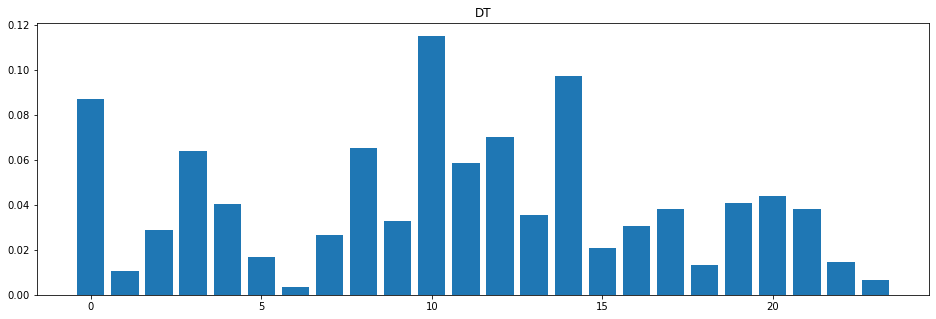

Feature importance by Suppoprt Vector Machine:->

Age -> -116.63076260035086
BusinessTravel -> 8.938078073842576
Department -> -35.50040995276214
DistanceFromHome -> -46.25643030896663
Education -> -63.81214078528467
EducationField -> -114.77165845708328
Gender -> 5.3608472061656585
JobLevel -> 3.026856870301117
JobRole -> 154.28720243559474
MaritalStatus -> 199.46101033261505
MonthlyIncome -> -0.17546513304114342
NumCompaniesWorked -> 235.24088429257847
PercentSalaryHike -> -1.0684347702790546
StockOptionLevel -> 13.792313232608649
TotalWorkingYears -> -97.80078422092538
TrainingTimesLastYear -> -151.50040995280813
YearsAtCompany -> -34.333571793441706
YearsSinceLastPromotion -> 204.512786376637
YearsWithCurrManager -> -185.74356313874205
EnvironmentSatisfaction -> -178.44154905994628
JobSatisfaction -> -113.61499067709804
WorkLifeBalance -> -54.1387428412105
JobInvolvement -> -31.59703065490703
PerformanceRating -> 1.0241621167363064


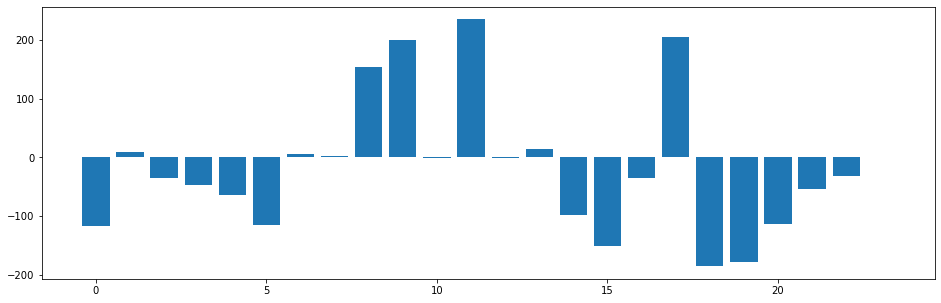

Feature importance by Logistic Regression:->

Age -> -0.028979110566545813
BusinessTravel -> 0.0001517947174193624
Department -> -0.0019835539441436763
DistanceFromHome -> 0.006932477853213163
Education -> -0.0013126555614428545
EducationField -> -0.005237021422492089
Gender -> 0.0005156857700082065
JobLevel -> -0.0008982995052555955
JobRole -> 0.005655816528798086
MaritalStatus -> 0.008356523035971904
MonthlyIncome -> -2.4058225776196202e-06
NumCompaniesWorked -> 0.014770908743085984
PercentSalaryHike -> 0.012418198763960046
StockOptionLevel -> -0.0004744847985602224
TotalWorkingYears -> -0.04205710997123874
TrainingTimesLastYear -> -0.004991355963126885
YearsAtCompany -> -0.0327778689210848
YearsSinceLastPromotion -> 0.003345445631989771
YearsWithCurrManager -> -0.028745228884244127
EnvironmentSatisfaction -> -0.00839755321266985
JobSatisfaction -> -0.008740142801343786
WorkLifeBalance -> -0.0033480099971720523
JobInvolvement -> -0.0005256198491101062
PerformanceRating -> 0.001049036

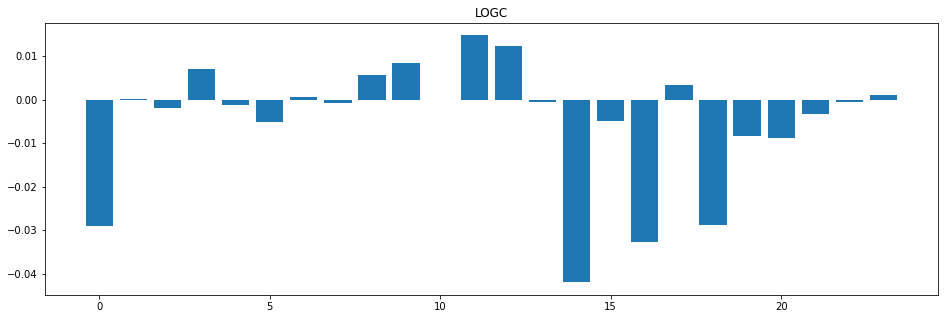

In [45]:
print("Feature importance by XGBoost:->\n")
XGBR = XGBClassifier()
XGBR.fit(X,y)
features = XGBR.feature_importances_
Columns = list(X.columns)
for i,j in enumerate(features):
    print(Columns[i],"->",j)
plt.figure(figsize=(16,5))
plt.title(label="XGBC")
plt.bar([x for x in range(len(features))],features)
plt.show()

plot_importance(XGBR)

print("Feature importance by Random Forest:->\n")
RF = RandomForestClassifier()
RF.fit(X,y)
features = RF.feature_importances_
Columns = list(X.columns)
for i,j in enumerate(features):
    print(Columns[i],"->",j)
plt.figure(figsize=(16,5))
plt.title(label="RF")
plt.bar([x for x in range(len(features))],features)
plt.show()

print("Feature importance by Decision Tree:->\n")
DT = DecisionTreeClassifier()
DT.fit(X,y)
features = DT.feature_importances_
Columns = list(X.columns)
for i,j in enumerate(features):
    print(Columns[i],"->",j)
plt.figure(figsize=(16,5))
plt.title(label="DT")
plt.bar([x for x in range(len(features))],features)
plt.show()

print("Feature importance by Suppoprt Vector Machine:->\n")
SVM = SVC(kernel="linear")
SVM.fit(X,y)
features = SVM.coef_[0]
Columns = list(X.columns)
for i,j in enumerate(features):
    print(Columns[i],"->",j)
plt.figure(figsize=(16,5))
plt.bar([x for x in range(len(features))],features)
plt.show()

print("Feature importance by Logistic Regression:->\n")
LOGC = LogisticRegression()
LOGC.fit(X,y)
features = LOGC.coef_[0]
Columns = list(X.columns)
for i,j in enumerate(features):
    print(Columns[i],"->",j)
plt.figure(figsize=(16,5))
plt.title(label="LOGC")
plt.bar([x for x in range(len(features))],features)
plt.show()

Is data Balanced ?

<AxesSubplot:>

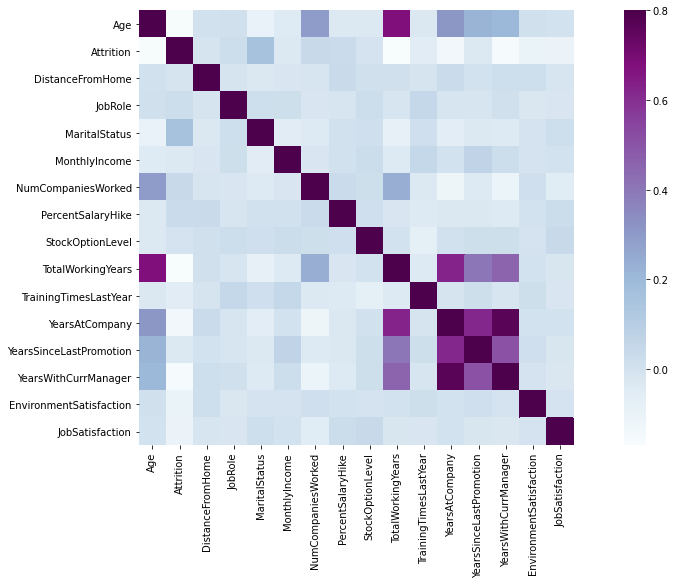

In [46]:
#Heat map of dataset with relative importance
matrix = data.drop(["BusinessTravel","Department","Education","EducationField","Gender","JobLevel","WorkLifeBalance","JobInvolvement","PerformanceRating"],axis=1).corr()
#f , ax = plt.subplots(figsize=(18,6))
plt.figure(figsize=(18,8))
sns.heatmap(matrix,vmax=0.8,square=True,cmap="BuPu")

It seems Application income and Loan Amount is correlated , also Coapplication income correlated with Loan Aount then Credit history is corrleated with Loan Status

In [47]:
A = list(data.Attrition).count(1)
B = list(data.Attrition).count(0)
print("Count of 1<Left>: ",A,"\nCount of 0<Stayed>: ",B)

fig = px.bar((A,B),x=["Left","Stayed"],y=[A,B],color=[A,B])
fig.show()

Count of 1<Left>:  711 
Count of 0<Stayed>:  3699


It seems that data is highly Imbalanced.

When the target classes does not have equal count then the data is considered as imbalanced data.

From above graph it seems that dataset contains more records with Approved Loan_Status than Rejected Loan_Status. 422 over 192

If data would have maximum of 20-30 records difference that time this imabalnced would be ignorable.

Which will lead to make wrong assumptions by model and also model will be biased after training. We will overcome this issue by balancing the data.

To overcome this problem we will balance the data using Resampling technique with Upsample and Downsample.

In [48]:
#To keep original data as it is to use the same for later.
new_data = data.copy()

#Getting seperated data with 1 and 0 status.
df_majority = new_data[new_data.Attrition==0]
df_minority = new_data[new_data.Attrition==1]

#Here we are downsampling the Majority Class Data Points. 
#i.e. We will get equal amount of datapoint as Minority class from Majority class

df_majority_downsampled = resample(df_majority,replace=False,n_samples=711,random_state=123)
df_downsampled = pd.concat([df_majority_downsampled,df_minority])
print("Downsampled data:->\n",df_downsampled.Attrition.value_counts())

#Here we are upsampling the Minority Class Data Points. 
#i.e. We will get equal amount of datapoint as Majority class from Minority class
df_minority_upsampled = resample(df_minority,replace=True,n_samples=3699,random_state=123)
df_upsampled = pd.concat([df_majority,df_minority_upsampled])
print("Upsampled data:->\n",df_upsampled.Attrition.value_counts())

Downsampled data:->
 0    711
1    711
Name: Attrition, dtype: int64
Upsampled data:->
 0    3699
1    3699
Name: Attrition, dtype: int64


In [49]:
#Experiment 1: Only Scaled data with all variables

X = new_data.drop(["Attrition"],axis=1)
y = new_data["Attrition"]
counter = Counter(y)
print("Counter: ",counter)

X_train , X_test , y_train , y_test = train_test_split(X,y,test_size=0.25,random_state=0)

#Scaling data here:------------->

StSc = StandardScaler()
X_train  = StSc.fit_transform(X_train)
X_test  = StSc.fit_transform(X_test)

#Check mean is 0 and Standard deviation is 1
print("After Standardization\nMean ",np.mean(X_train),"Standard Deviation ",np.std(X_train),"\n")

#Voting ensemble mathod. Combining all tree based algorithms.
models = []
models.append(("XGB",XGBClassifier()))
models.append(("RF",RandomForestClassifier()))
models.append(("DT",DecisionTreeClassifier()))
models.append(("ADB",AdaBoostClassifier()))
models.append(("GB",GradientBoostingClassifier()))

ensemble = VotingClassifier(estimators=models)
ensemble.fit(X_train,y_train)
y_pred = ensemble.predict(X_test) 
print(classification_report(y_pred,y_test))
print("Voting Ensemble:>",accuracy_score(y_pred,y_test))



SVM = SVC(kernel="linear",class_weight="balanced",probability=True)
SVM.fit(X_train,y_train)
y_pred = SVM.predict(X_test)
print(classification_report(y_pred,y_test))
print("SVM:>",accuracy_score(y_pred,y_test))


XGBC = XGBClassifier(learning_rate =0.1,n_estimators=10000,max_depth=4,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,
 reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27,eval_metric = "logloss")
XGBC.fit(X_train,y_train)
y_pred = XGBC.predict(X_test)
print(classification_report(y_pred,y_test))
print("XGBoost:>",accuracy_score(y_pred,y_test))

Model1 = RandomForestClassifier(n_estimators=1000,random_state=0,n_jobs=1000,max_depth=70,bootstrap=True)
Model1.fit(X_train,y_train)
y_pred = Model1.predict(X_test)
print(classification_report(y_pred,y_test))
print("RandomForestClassifier:>",accuracy_score(y_pred,y_test))


Model2 = GradientBoostingClassifier()
Model2.fit(X_train,y_train)
y_pred = Model2.predict(X_test)
print(classification_report(y_pred,y_test))
print("GradientBoostingClassifier:>",accuracy_score(y_pred,y_test))


Model3 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=100,
 max_features=1.0, max_leaf_nodes=10,
 min_impurity_split=1e-07, min_samples_leaf=1,
 min_samples_split=2, min_weight_fraction_leaf=0.10,
 random_state=27, splitter='best')
Model3.fit(X_train,y_train)
y_pred = Model3.predict(X_test)
print(classification_report(y_pred,y_test))
print("DecisionTreeClassifier:>",accuracy_score(y_pred,y_test))


Model4 = AdaBoostClassifier()
Model4.fit(X_train,y_train)
y_pred = Model4.predict(X_test)
print(classification_report(y_pred,y_test))
print("AdaBoostClassifier:>",accuracy_score(y_pred,y_test))


Model5 = LinearDiscriminantAnalysis()
Model5.fit(X_train,y_train)
y_pred = Model5.predict(X_test)
print(classification_report(y_pred,y_test))
print("LinearDiscriminantAnalysis:>",accuracy_score(y_pred,y_test),"\n")


KNN = KNeighborsClassifier(leaf_size=1,p=2,n_neighbors=20)
KNN.fit(X_train,y_train)
y_pred = KNN.predict(X_test)
print(classification_report(y_pred,y_test))
print("KNeighborsClassifier:>",accuracy_score(y_pred,y_test))


Model7 = GaussianNB()
Model7.fit(X_train,y_train)
y_pred = Model7.predict(X_test)
print(classification_report(y_pred,y_test))
print("GaussianNB:>",accuracy_score(y_pred,y_test))


Model8 = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Model8.fit(X_train,y_train)
y_pred = Model8.predict(X_test)
print(classification_report(y_pred,y_test))
print("Logistic Regression:>",accuracy_score(y_pred,y_test))

Counter:  Counter({0: 3699, 1: 711})
After Standardization
Mean  1.248875008045232e-17 Standard Deviation  0.9999999999999999 

[19:11:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       952
           1       0.88      1.00      0.94       151

    accuracy                           0.98      1103
   macro avg       0.94      0.99      0.96      1103
weighted avg       0.98      0.98      0.98      1103

Voting Ensemble:> 0.9818676337262012
              precision    recall  f1-score   support

           0       0.67      0.91      0.77       685
           1       0.64      0.26      0.37       418

    accuracy                      

In [50]:
#Experiment 2: Sclaed + Down Sampled Data

X = df_downsampled.drop(["Attrition"],axis=1)
y = df_downsampled.Attrition
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size=0.25,random_state=0)


#Scaling data here:------------->

StSc = StandardScaler()
X_train  = StSc.fit_transform(X_train)
X_test  = StSc.fit_transform(X_test)

#Check mean is 0 and Standard deviation is 1
print("After Standardization\nMean ",np.mean(X_train),"Standard Deviation ",np.std(X_train),"\n")

#Voting ensemble mathod. Combining all tree based algorithms.
models = []
models.append(("XGB",XGBClassifier()))
models.append(("RF",RandomForestClassifier()))
models.append(("DT",DecisionTreeClassifier()))
models.append(("ADB",AdaBoostClassifier()))
models.append(("GB",GradientBoostingClassifier()))

ensemble = VotingClassifier(estimators=models)
ensemble.fit(X_train,y_train)
y_pred = ensemble.predict(X_test) 
print(classification_report(y_pred,y_test))
print("Voting Ensemble:>",accuracy_score(y_pred,y_test))



SVM = SVC(kernel="linear",class_weight="balanced",probability=True)
SVM.fit(X_train,y_train)
y_pred = SVM.predict(X_test)
print(classification_report(y_pred,y_test))
print("SVM:>",accuracy_score(y_pred,y_test))


XGBC = XGBClassifier(learning_rate =0.1,n_estimators=10000,max_depth=4,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,
 reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27,eval_metric = "logloss")
XGBC.fit(X_train,y_train)
y_pred = XGBC.predict(X_test)
print(classification_report(y_pred,y_test))
print("XGBoost:>",accuracy_score(y_pred,y_test))

Model1 = RandomForestClassifier(n_estimators=1000,random_state=0,n_jobs=1000,max_depth=70,bootstrap=True)
Model1.fit(X_train,y_train)
y_pred = Model1.predict(X_test)
print(classification_report(y_pred,y_test))
print("RandomForestClassifier:>",accuracy_score(y_pred,y_test))


Model2 = GradientBoostingClassifier()
Model2.fit(X_train,y_train)
y_pred = Model2.predict(X_test)
print(classification_report(y_pred,y_test))
print("GradientBoostingClassifier:>",accuracy_score(y_pred,y_test))


Model3 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=100,
 max_features=1.0, max_leaf_nodes=10,
 min_impurity_split=1e-07, min_samples_leaf=1,
 min_samples_split=2, min_weight_fraction_leaf=0.10,
 random_state=27, splitter='best')
Model3.fit(X_train,y_train)
y_pred = Model3.predict(X_test)
print(classification_report(y_pred,y_test))
print("DecisionTreeClassifier:>",accuracy_score(y_pred,y_test))


Model4 = AdaBoostClassifier()
Model4.fit(X_train,y_train)
y_pred = Model4.predict(X_test)
print(classification_report(y_pred,y_test))
print("AdaBoostClassifier:>",accuracy_score(y_pred,y_test))


Model5 = LinearDiscriminantAnalysis()
Model5.fit(X_train,y_train)
y_pred = Model5.predict(X_test)
print(classification_report(y_pred,y_test))
print("LinearDiscriminantAnalysis:>",accuracy_score(y_pred,y_test))

KNN = KNeighborsClassifier(leaf_size=1,p=2,n_neighbors=20)
KNN.fit(X_train,y_train)
y_pred = KNN.predict(X_test)
print(classification_report(y_pred,y_test))
print("KNeighborsClassifier:>",accuracy_score(y_pred,y_test))


Model7 = GaussianNB()
Model7.fit(X_train,y_train)
y_pred = Model7.predict(X_test)
print(classification_report(y_pred,y_test))
print("GaussianNB:>",accuracy_score(y_pred,y_test))


Model8 = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False,)
Model8.fit(X_train,y_train)
y_pred = Model8.predict(X_test)
print(classification_report(y_pred,y_test))
print("Logistic Regression:>",accuracy_score(y_pred,y_test))

After Standardization
Mean  -1.3192143507115681e-17 Standard Deviation  1.0 

[19:13:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       164
           1       0.98      0.91      0.94       192

    accuracy                           0.94       356
   macro avg       0.94      0.94      0.94       356
weighted avg       0.94      0.94      0.94       356

Voting Ensemble:> 0.9410112359550562
              precision    recall  f1-score   support

           0       0.65      0.66      0.65       176
           1       0.66      0.65      0.66       180

    accuracy                           0.65       356
   macro avg       0.65      0

In [51]:
#Experiment 3: Sclaed + Up Sampled Data

X = df_upsampled.drop(["Attrition"],axis=1)
y = df_upsampled.Attrition
print(len(X),len(y))
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size=0.25,random_state=0)

#Scaling data here:------------->

StSc = StandardScaler()
X_train  = StSc.fit_transform(X_train)
X_test  = StSc.fit_transform(X_test)

#Check mean is 0 and Standard deviation is 1
print("After Standardization\nMean ",np.mean(X_train),"Standard Deviation ",np.std(X_train),"\n")

#Voting ensemble mathod. Combining all tree based algorithms.
models = []
models.append(("XGB",XGBClassifier()))
models.append(("RF",RandomForestClassifier()))
models.append(("DT",DecisionTreeClassifier()))
models.append(("ADB",AdaBoostClassifier()))
models.append(("GB",GradientBoostingClassifier()))

ensemble = VotingClassifier(estimators=models)
ensemble.fit(X_train,y_train)
y_pred = ensemble.predict(X_test) 
print(classification_report(y_pred,y_test))
print("Voting Ensemble:>",accuracy_score(y_pred,y_test))



SVM = SVC(kernel="linear",class_weight="balanced",probability=True)
SVM.fit(X_train,y_train)
y_pred = SVM.predict(X_test)
print(classification_report(y_pred,y_test))
print("SVM:>",accuracy_score(y_pred,y_test))


XGBC = XGBClassifier(learning_rate =0.1,n_estimators=10000,max_depth=4,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,
 reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27,eval_metric = "logloss")
XGBC.fit(X_train,y_train)
y_pred = XGBC.predict(X_test)
print(classification_report(y_pred,y_test))
print("XGBoost:>",accuracy_score(y_pred,y_test))

Model1 = RandomForestClassifier(n_estimators=1000,random_state=0,n_jobs=1000,max_depth=70,bootstrap=True)
Model1.fit(X_train,y_train)
y_pred = Model1.predict(X_test)
print(classification_report(y_pred,y_test))
print("RandomForestClassifier:>",accuracy_score(y_pred,y_test))


Model2 = GradientBoostingClassifier()
Model2.fit(X_train,y_train)
y_pred = Model2.predict(X_test)
print(classification_report(y_pred,y_test))
print("GradientBoostingClassifier:>",accuracy_score(y_pred,y_test))


Model3 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=100,
 max_features=1.0, max_leaf_nodes=10,
 min_impurity_split=1e-07, min_samples_leaf=1,
 min_samples_split=2, min_weight_fraction_leaf=0.10,
 random_state=27, splitter='best')
Model3.fit(X_train,y_train)
y_pred = Model3.predict(X_test)
print(classification_report(y_pred,y_test))
print("DecisionTreeClassifier:>",accuracy_score(y_pred,y_test))


Model4 = AdaBoostClassifier()
Model4.fit(X_train,y_train)
y_pred = Model4.predict(X_test)
print(classification_report(y_pred,y_test))
print("AdaBoostClassifier:>",accuracy_score(y_pred,y_test))


Model5 = LinearDiscriminantAnalysis()
Model5.fit(X_train,y_train)
y_pred = Model5.predict(X_test)
print(classification_report(y_pred,y_test))
print("LinearDiscriminantAnalysis:>",accuracy_score(y_pred,y_test))

KNN = KNeighborsClassifier(leaf_size=1,p=2,n_neighbors=20)
KNN.fit(X_train,y_train)
y_pred = KNN.predict(X_test)
print(classification_report(y_pred,y_test))
print("KNeighborsClassifier:>",accuracy_score(y_pred,y_test))


Model7 = GaussianNB()
Model7.fit(X_train,y_train)
y_pred = Model7.predict(X_test)
print(classification_report(y_pred,y_test))
print("GaussianNB:>",accuracy_score(y_pred,y_test))


Model8 = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Model8.fit(X_train,y_train)
y_pred = Model8.predict(X_test)
print(classification_report(y_pred,y_test))
print("Logistic Regression:>",accuracy_score(y_pred,y_test))

7398 7398
After Standardization
Mean  -1.0912790604943259e-17 Standard Deviation  1.0 

[19:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       930
           1       0.98      1.00      0.99       920

    accuracy                           0.99      1850
   macro avg       0.99      0.99      0.99      1850
weighted avg       0.99      0.99      0.99      1850

Voting Ensemble:> 0.9918918918918919
              precision    recall  f1-score   support

           0       0.66      0.71      0.68       854
           1       0.73      0.69      0.71       996

    accuracy                           0.70      1850
   macro avg       0

In [52]:
# Experiment 4: Sclaed + Selected features with respective importance
#Droping features which are less important and keeping features as per importance analysis.
X = data.drop(["BusinessTravel","Department","Education","EducationField","Gender","JobLevel","WorkLifeBalance","JobInvolvement","PerformanceRating"],axis=1)
#X = new_data.drop(["Loan_Status","Loan_ID"],axis=1)
y = new_data.Attrition
print(len(X),len(y))
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size=0.25,random_state=0)

#Scaling data here:------------->

StSc = StandardScaler()
X_train  = StSc.fit_transform(X_train)
X_test  = StSc.fit_transform(X_test)

#Check mean is 0 and Standard deviation is 1
print("After Standardization\nMean ",np.mean(X_train),"Standard Deviation ",np.std(X_train),"\n")

#Voting ensemble mathod. Combining all tree based algorithms.
models = []
models.append(("XGB",XGBClassifier()))
models.append(("RF",RandomForestClassifier()))
models.append(("DT",DecisionTreeClassifier()))
models.append(("ADB",AdaBoostClassifier()))
models.append(("GB",GradientBoostingClassifier()))

ensemble = VotingClassifier(estimators=models)
ensemble.fit(X_train,y_train)
y_pred = ensemble.predict(X_test) 
print(classification_report(y_pred,y_test))
print("Voting Ensemble:>",accuracy_score(y_pred,y_test))



SVM = SVC(kernel="linear",class_weight="balanced",probability=True)
SVM.fit(X_train,y_train)
y_pred = SVM.predict(X_test)
print(classification_report(y_pred,y_test))
print("SVM:>",accuracy_score(y_pred,y_test))


XGBC = XGBClassifier(learning_rate =0.1,n_estimators=10000,max_depth=4,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,
 reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27,eval_metric = "logloss")
XGBC.fit(X_train,y_train)
y_pred = XGBC.predict(X_test)
print(classification_report(y_pred,y_test))
print("XGBoost:>",accuracy_score(y_pred,y_test))

Model1 = RandomForestClassifier(n_estimators=1000,random_state=0,n_jobs=1000,max_depth=70,bootstrap=True)
Model1.fit(X_train,y_train)
y_pred = Model1.predict(X_test)
print(classification_report(y_pred,y_test))
print("RandomForestClassifier:>",accuracy_score(y_pred,y_test))


Model2 = GradientBoostingClassifier()
Model2.fit(X_train,y_train)
y_pred = Model2.predict(X_test)
print(classification_report(y_pred,y_test))
print("GradientBoostingClassifier:>",accuracy_score(y_pred,y_test))


Model3 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=100,
 max_features=1.0, max_leaf_nodes=10,
 min_impurity_split=1e-07, min_samples_leaf=1,
 min_samples_split=2, min_weight_fraction_leaf=0.10,
 random_state=27, splitter='best')
Model3.fit(X_train,y_train)
y_pred = Model3.predict(X_test)
print(classification_report(y_pred,y_test))
print("DecisionTreeClassifier:>",accuracy_score(y_pred,y_test))


Model4 = AdaBoostClassifier()
Model4.fit(X_train,y_train)
y_pred = Model4.predict(X_test)
print(classification_report(y_pred,y_test))
print("AdaBoostClassifier:>",accuracy_score(y_pred,y_test))


Model5 = LinearDiscriminantAnalysis()
Model5.fit(X_train,y_train)
y_pred = Model5.predict(X_test)
print(classification_report(y_pred,y_test))
print("LinearDiscriminantAnalysis:>",accuracy_score(y_pred,y_test))

KNN = KNeighborsClassifier(leaf_size=1,p=2,n_neighbors=20)
KNN.fit(X_train,y_train)
y_pred = KNN.predict(X_test)
print(classification_report(y_pred,y_test))
print("KNeighborsClassifier:>",accuracy_score(y_pred,y_test))


Model7 = GaussianNB()
Model7.fit(X_train,y_train)
y_pred = Model7.predict(X_test)
print(classification_report(y_pred,y_test))
print("GaussianNB:>",accuracy_score(y_pred,y_test))


Model8 = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Model8.fit(X_train,y_train)
y_pred = Model8.predict(X_test)
print(classification_report(y_pred,y_test))
print("Logistic Regression:>",accuracy_score(y_pred,y_test))

4410 4410
After Standardization
Mean  -1.6517379138662747e-17 Standard Deviation  1.0 

[19:15:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       932
           1       1.00      1.00      1.00       171

    accuracy                           1.00      1103
   macro avg       1.00      1.00      1.00      1103
weighted avg       1.00      1.00      1.00      1103

Voting Ensemble:> 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       932
           1       1.00      1.00      1.00       171

    accuracy                           1.00      1103
   macro avg       1.00      1.00  

Conclusion Resut Summary is as below:-----> Algorithm : Accuracy

Experiment 1 : Scaled data only

Support Vector Machine 66.36 Decision Tree 84.497 Linear Discriminant Analysis 85.041 KNearest Neighbors 85.857 Gaussian Naivey Bayes 83.046 Logistic Regression 84.95

Experiment 2: Sclaed + Down Sampled Data

XGBoost 89.325 Decision Tree 64.045 Adaboost 71.067 RandomForestClassifier:95.785

Experiment 3: Sclaed + Up Sampled Data

RandomForestClassifier 100.00 GradientBoostingClassifier 87.459 XGBoost 99.838 Decision Tree 67.027

Experiment 4: Sclaed + Selected features with respective importance

Support Vector Machine 100.00 Decision Tree 100.00 AdaBoost 100.00 Linear Discriminant Analysis 100.00 KNearest Neighbors 98.912 Gaussian Naivey Bayes 100.00 Logistic Regression 100.00


After all possible experiments Maximum accuracy achieved By making data balanced as Sclaed + Selected features with respective importance. Surprisingly only Random forest performed well in that state of the data.